# WEEK 3 ASSIGNMENT

The objective of this assignment is to construct and analyze

optimal investment portfolios using historical market data by:

estimating expected returns and risks,

generating a large set of feasible portfolios,

identifying the efficient frontier, and

computing optimal portfolios for different risk preferences using convex optimization.




In [105]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cvxpy as cp
#importing all the required libraries

In [107]:
TICKERS = []
noofassets=input("enter the number of assets")
for c in range(int(noofassets)):
  TICKERS.append(input("enter the asset"))

df = yf.download(TICKERS, period="1y")
prices = df.xs("Close", axis=1, level=0)

prices = prices.fillna(method="ffill").dropna()
prices.head()
#accepting the no. of assets from the user and their names in yahoo finance code
#downloading the data of the those assets for previous 10 years which includes open, close, high ,low and volume and storing it in dataframe
#selecting only the close data of all the assets
#filling any missing data with the close data of the previous date and after that if anything remains still NaN then dropping the data of that day
#printing the head of the dataframe



enter the number of assets5
enter the assetHDFCBANK.NS
enter the assetSILVERCASE.NS
enter the assetOLAELEC.NS
enter the assetGOLDCASE.NS
enter the assetCOALINDIA.NS


/tmp/ipython-input-2923900571.py:6: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(TICKERS, period="10y")
[*********************100%***********************]  5 of 5 completed
/tmp/ipython-input-2923900571.py:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  prices = prices.fillna(method="ffill").dropna()


Ticker,COALINDIA.NS,GOLDCASE.NS,HDFCBANK.NS,OLAELEC.NS,SILVERCASE.NS
Date,,,,,
2025-03-26,373.743103,13.92,891.228333,51.740002,10.17
2025-03-27,375.683807,14.02,900.502930,55.099998,10.18
2025-03-28,376.961761,14.14,901.908936,53.049999,10.37
2025-04-01,376.441132,14.47,872.136353,52.709999,10.26
2025-04-02,376.299072,14.47,886.467651,54.070000,10.25


In [108]:
log_returns = np.log(prices / prices.shift(1))
log_returns = log_returns.dropna()
log_returns.tail()
# finding log returns, dropping missing values and printing the tail of the
# dataframe %%

Ticker,COALINDIA.NS,GOLDCASE.NS,HDFCBANK.NS,OLAELEC.NS,SILVERCASE.NS
Date,,,,,
2025-12-29,-0.003737,-0.006464,-0.000403,-0.021224,0.003438
2025-12-30,-0.006636,-0.021063,-0.000807,0.031943,-0.009050
2025-12-31,0.002509,-0.007597,0.000303,-0.009338,-0.009570
2026-01-01,0.003628,0.001429,-0.000050,0.034711,-0.003064
2026-01-02,0.066301,0.010888,0.010488,0.086011,0.030652


In [109]:
TRADING_DAYS = 252
mu = log_returns.mean() * TRADING_DAYS                     #TO DO : Calculate Expected return (annual)
cov_matrix =    log_returns.cov() * TRADING_DAYS           #TO DO : Calculate Covariance matrix

mu, cov_matrix
# finding the mean of all the assets and the covariance matrix

(Ticker
 COALINDIA.NS     0.176688
 GOLDCASE.NS      0.551736
 HDFCBANK.NS      0.152445
 OLAELEC.NS      -0.307291
 SILVERCASE.NS    1.094710
 dtype: float64,
 Ticker         COALINDIA.NS  GOLDCASE.NS  HDFCBANK.NS  OLAELEC.NS  \
 Ticker                                                              
 COALINDIA.NS       0.031362     0.000727     0.007571    0.029602   
 GOLDCASE.NS        0.000727     0.034723     0.000310    0.006420   
 HDFCBANK.NS        0.007571     0.000310     0.021552    0.011653   
 OLAELEC.NS         0.029602     0.006420     0.011653    0.334038   
 SILVERCASE.NS      0.002746     0.037478    -0.002409    0.004417   
 
 Ticker         SILVERCASE.NS  
 Ticker                        
 COALINDIA.NS        0.002746  
 GOLDCASE.NS         0.037478  
 HDFCBANK.NS        -0.002409  
 OLAELEC.NS          0.004417  
 SILVERCASE.NS       0.107670  )

In [110]:
n = len(TICKERS)
weights = np.vstack([
    np.random.dirichlet(0.2 * np.ones(n), size=150_000),
    np.random.dirichlet(1.0 * np.ones(n), size=150_000),
    np.random.dirichlet(2.0 * np.ones(n), size=100_000),
])
# Generate random portfolio weights using a MIXTURE of Dirichlet distributions.

In [111]:
portfolio_returns = []
portfolio_volatility = []


# Loop over every feasible portfolio weight vector
for w in weights:
    ret =  np.dot(w, mu)                        # TO DO : Calculate return of Portfolio
    var =   np.dot(w, np.dot(cov_matrix, w))                      # TO DO : Calculate Volatility

    portfolio_returns.append(ret)
    portfolio_volatility.append(np.sqrt(var))

portfolio_df = pd.DataFrame(weights, columns=TICKERS)
portfolio_df["Return"] = portfolio_returns
portfolio_df["Volatility"] = portfolio_volatility

portfolio_df

# calculating return and volatility for each portfolio

,HDFCBANK.NS,SILVERCASE.NS,OLAELEC.NS,GOLDCASE.NS,COALINDIA.NS,Return,Volatility
0,6.197424e-03,1.208317e-01,0.002926,4.515017e-04,0.869593,1.020022,0.299712
1,1.165220e-01,2.225880e-03,0.000676,8.731412e-08,0.880576,0.985894,0.290902
2,1.207381e-01,2.195605e-01,0.001742,6.440755e-01,0.013884,-0.039982,0.384092
3,3.895046e-07,2.684045e-03,0.000208,9.970832e-01,0.000025,-0.304855,0.576309
4,4.518792e-06,2.931212e-07,0.293823,7.021583e-01,0.004014,-0.166580,0.413980
...,...,...,...,...,...,...,...
399995,2.115215e-01,1.692974e-01,0.231158,1.378643e-01,0.250159,0.397506,0.153992
399996,3.616275e-01,1.401992e-01,0.185193,1.679670e-01,0.145013,0.276613,0.157596
399997,1.770166e-02,6.908269e-01,0.036170,9.644883e-02,0.158853,0.534055,0.178504
399998,3.344047e-01,1.156107e-02,0.426238,9.143467e-02,0.136362,0.251622,0.131604


In [112]:
comp=pd.DataFrame(columns = ["Value of RAF","Return of that Portfolio","Volatility of that Portfolio"])
comp["Value of RAF"]=[0,1,2,3,4,5,10,12,14,16,20,30,40,70,100,150,200]
for i in range(len(comp)):
  RAF=comp["Value of RAF"][i]
  w=cp.Variable(int(noofassets))
  objective=cp.Maximize(w@mu-(RAF*(cp.quad_form(w, cov_matrix))))
  constraints=[w>=0,cp.sum(w)==1]
  prob=cp.Problem(objective,constraints)
  prob.solve()
  dfd = pd.Series(w.value, index=TICKERS)
  opt_return = dfd.values @ mu
  opt_variance = dfd.values.T @ cov_matrix @ dfd.values
  opt_volatility = np.sqrt(opt_variance)
  comp.loc[i,"Return of that Portfolio"]=opt_return
  comp.loc[i,"Volatility of that Portfolio"]=opt_volatility
  comp.loc[i,TICKERS]=abs(w.value.round(2))
comp

# Compare CVXPY optimal portfolios across different risk aversion levels (RAF)


,Value of RAF,Return of that Portfolio,Volatility of that Portfolio,HDFCBANK.NS,SILVERCASE.NS,OLAELEC.NS,GOLDCASE.NS,COALINDIA.NS
0,0,1.09471,0.328131,0.00,0.00,0.00,0.0,1.00
1,1,1.09471,0.328131,0.00,0.00,0.00,0.0,1.00
2,2,1.09471,0.328131,0.00,0.00,0.00,0.0,1.00
3,3,1.09471,0.328131,0.00,0.00,0.00,0.0,1.00
4,4,1.07603,0.320812,0.00,0.03,0.00,0.0,0.97
5,5,0.966735,0.279873,0.00,0.24,0.00,0.0,0.76
6,10,0.632458,0.16962,0.10,0.30,0.23,0.0,0.38
7,12,0.574318,0.153106,0.12,0.30,0.26,0.0,0.32
8,14,0.532789,0.142225,0.14,0.30,0.29,0.0,0.27
9,16,0.501642,0.134693,0.15,0.31,0.30,0.0,0.24


In [113]:
RAF=float(input("Enter the Risk Aversion Factor "))
w=cp.Variable(int(noofassets))
objective=cp.Maximize(w@mu-(RAF*(cp.quad_form(w, cov_matrix))))
constraints=[w>=0,cp.sum(w)==1]
prob=cp.Problem(objective,constraints)
prob.solve()
dfd = pd.Series(w.value, index=TICKERS)
weights_pct = 100 *abs(dfd)
weights_pct = weights_pct.round(2)
print(weights_pct)
weights_pct
opt_return = dfd.values @ mu
opt_variance = dfd.values.T @ cov_matrix @ dfd.values
opt_volatility = np.sqrt(opt_variance)
print(f"Optimal Return: {opt_return}")
print(f"Optimal Volatility: {opt_volatility}")
print(f"Return-RAF*Risk:{prob.solve()}")
# inputing the risk aversion factor from the user and calculating the most optimal portfolio while maximizing (return-RAF*risk) by
# using cvxpy library
# rounding off the allocated weights to two decimal places and writing the percent value and also returning the return and
# volatility of the optimal portfolio

Enter the Risk Aversion Factor 10
HDFCBANK.NS       9.60
SILVERCASE.NS    29.70
OLAELEC.NS       22.60
GOLDCASE.NS       0.00
COALINDIA.NS     38.11
dtype: float64
Optimal Return: 0.6324576034149914
Optimal Volatility: 0.16962019213431961
Return-RAF*Risk:0.3447475076181564


In [114]:
results = []

n = len(TICKERS)

def portfolio_metrics(w, mu, cov):
    ret = w @ mu
    vol = np.sqrt(w.T @ cov @ w)
    diff= ret - RAF * vol
    return ret, vol, diff

for i in range(len(TICKERS)):
    asset = TICKERS[i]
    w = np.zeros(n)
    w[i] = 1.0
    ret, vol, diff = portfolio_metrics(w, mu, cov_matrix)

    results.append({
        "Portfolio": f"100% {asset}",
        "Type": "(Single Asset)",
        "Return": ret,
        "Volatility": vol,
        "Return-RAF*Risk": diff
    })

w_eq = np.ones(n) / n
ret, vol, diff = portfolio_metrics(w_eq, mu, cov_matrix)

results.append({
    "Portfolio": "Equal Weight",
    "Type": "(Equal)",
    "Return": ret,
    "Volatility": vol,
    "Return-RAF*Risk": diff
})
comparison_df = pd.DataFrame(results)
comparison_df

# Compare naive benchmark portfolios using return, risk, and RAF-adjusted performance


,Portfolio,Type,Return,Volatility,Return-RAF*Risk
0,100% HDFCBANK.NS,(Single Asset),0.176688,0.177092,-1.594230
1,100% SILVERCASE.NS,(Single Asset),0.551736,0.186342,-1.311686
2,100% OLAELEC.NS,(Single Asset),0.152445,0.146805,-1.315609
3,100% GOLDCASE.NS,(Single Asset),-0.307291,0.577960,-6.086895
4,100% COALINDIA.NS,(Single Asset),1.094710,0.328131,-2.186605
5,Equal Weight,(Equal),0.333658,0.170456,-1.370898


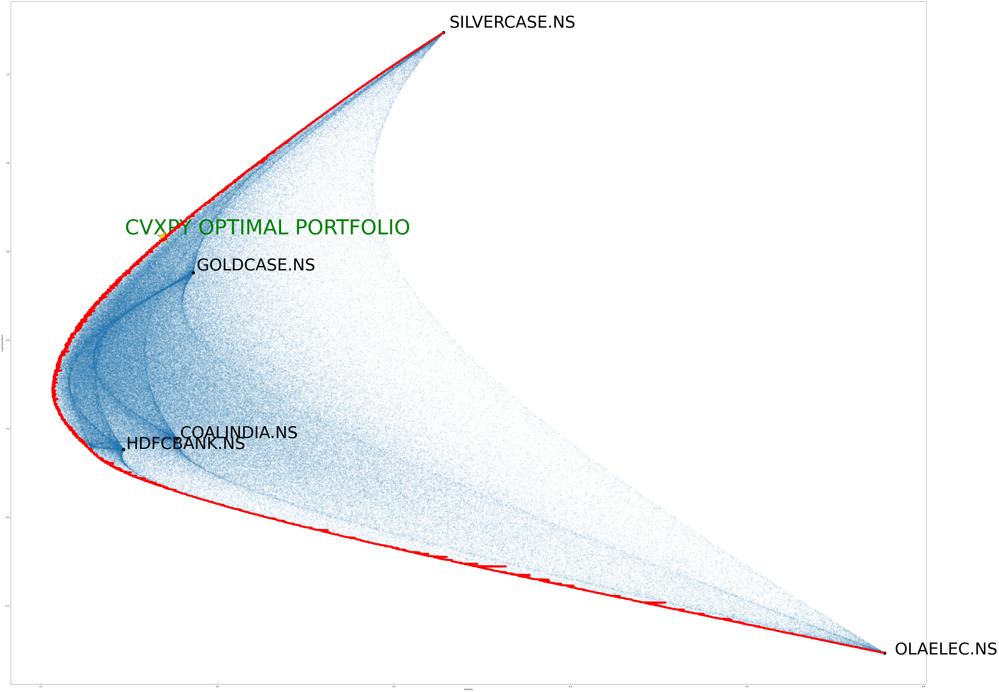

In [115]:
bins = np.linspace(
    portfolio_df["Return"].min(),
    portfolio_df["Return"].max(),
    2000
)
asset_vol =   np.sqrt(np.diag(cov_matrix))                     # TO DO : Compute individual asset volatility (annualized)
asset_vol = pd.Series(asset_vol, index=mu.index)
frontier_risk = []
frontier_return = []

for i in range(len(bins)-1):
    mask = (portfolio_df["Return"] >= bins[i]) & (portfolio_df["Return"] < bins[i+1])
    subset = portfolio_df[mask]

    if len(subset) > 0:
        min_row = subset.loc[subset["Volatility"].idxmin()]
        frontier_risk.append(min_row["Volatility"])
        frontier_return.append(min_row["Return"])

plt.figure(figsize=(80,60))
plt.scatter(portfolio_df["Volatility"], portfolio_df["Return"], alpha=0.05)
plt.plot(frontier_risk, frontier_return, color="red", linewidth=10,zorder=20)
plt.scatter(
    opt_volatility,
    opt_return,
    color="gold",
    marker="*",
    s=4400,
    edgecolor="black",
    zorder=10
)
plt.text(opt_volatility*0.87,opt_return*1.01, "CVXPY OPTIMAL PORTFOLIO", size = 100, color="Green")
plt.scatter(asset_vol, mu, s=220, color="black")
for asset in mu.index:
    plt.text(asset_vol[asset]*1.01, mu[asset]*1.01, asset,size=80)
plt.xlabel("Volatility")
plt.ylabel("Expected Return")
plt.autoscale()
plt.show()
